# 1) Prepare a classification model using SVM for salary data 

Data Description:

age -- age of a person
workclass	-- A work class is a grouping of work 
education	-- Education of an individuals	
maritalstatus -- Marital status of an individulas	
occupation	 -- occupation of an individuals
relationship -- 	
race --  Race of an Individual
sex --  Gender of an Individual
capitalgain --  profit received from the sale of an investment	
capitalloss	-- A decrease in the value of a capital asset
hoursperweek -- number of hours work per week	
native -- Native of an individual
Salary -- salary of an individual

In [1]:
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt

# Read the data

In [25]:
salary_train=pd.read_csv('SalaryData_Train(1).csv')
salary_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
30157,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
30158,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
30159,22,Private,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [26]:
salary_train.shape

(30161, 14)

In [27]:
salary_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30161 entries, 0 to 30160
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            30161 non-null  int64 
 1   workclass      30161 non-null  object
 2   education      30161 non-null  object
 3   educationno    30161 non-null  int64 
 4   maritalstatus  30161 non-null  object
 5   occupation     30161 non-null  object
 6   relationship   30161 non-null  object
 7   race           30161 non-null  object
 8   sex            30161 non-null  object
 9   capitalgain    30161 non-null  int64 
 10  capitalloss    30161 non-null  int64 
 11  hoursperweek   30161 non-null  int64 
 12  native         30161 non-null  object
 13  Salary         30161 non-null  object
dtypes: int64(5), object(9)
memory usage: 3.2+ MB


In [29]:
salary_train['workclass']=pd.Categorical(salary_train['workclass'])
salary_train['workclass']=salary_train['workclass'].cat.codes

In [30]:
salary_train['education']=pd.Categorical(salary_train['education'])
salary_train['education']=salary_train['education'].cat.codes

In [31]:
salary_train['maritalstatus']=pd.Categorical(salary_train['maritalstatus'])
salary_train['maritalstatus']=salary_train['maritalstatus'].cat.codes

In [32]:
salary_train['occupation']=pd.Categorical(salary_train['occupation'])
salary_train['occupation']=salary_train['occupation'].cat.codes

In [33]:
salary_train['relationship']=pd.Categorical(salary_train['relationship'])
salary_train['relationship']=salary_train['relationship'].cat.codes

In [34]:
salary_train['race']=pd.Categorical(salary_train['race'])
salary_train['race']=salary_train['race'].cat.codes

In [35]:
salary_train['sex']=pd.Categorical(salary_train['sex'])
salary_train['sex']=salary_train['sex'].cat.codes

In [36]:
salary_train['native']=pd.Categorical(salary_train['native'])
salary_train['native']=salary_train['native'].cat.codes

In [37]:
salary_train['Salary']=pd.Categorical(salary_train['Salary'])
salary_train['Salary']=salary_train['Salary'].cat.codes

In [38]:
salary_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174,0,40,37,0
1,50,4,9,13,2,3,0,4,1,0,0,13,37,0
2,38,2,11,9,0,5,1,4,1,0,0,40,37,0
3,53,2,1,7,2,5,0,2,1,0,0,40,37,0
4,28,2,9,13,2,9,5,2,0,0,0,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,2,7,12,2,12,5,4,0,0,0,38,37,0
30157,40,2,11,9,2,6,0,4,1,0,0,40,37,1
30158,58,2,11,9,6,0,4,4,0,0,0,40,37,0
30159,22,2,11,9,4,0,3,4,1,0,0,20,37,0


In [39]:
salary_train.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

<Axes: >

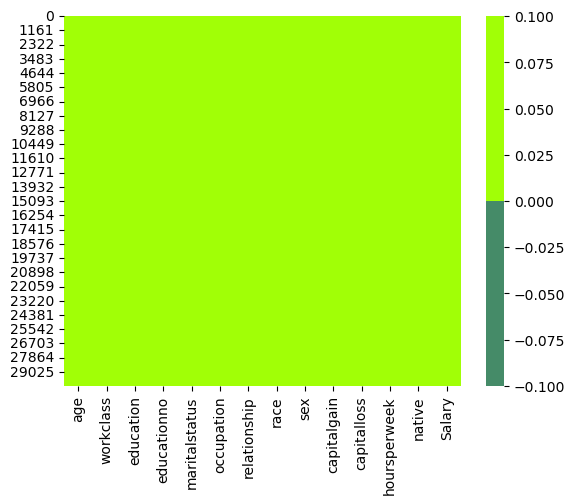

In [40]:
color=['#458B68','#A1FF06']
pal=sns.color_palette(color)
sns.heatmap(salary_train.isnull(),cmap=pal)

In [41]:
salary_train.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.080537,-0.001091,0.043525,-0.276363,-0.005682,-0.246452,0.023380,0.081972,0.080152,0.060278,0.101598,-0.001548,0.241991
workclass,0.080537,1.000000,0.017864,0.037833,-0.034235,0.015572,-0.067414,0.044734,0.074966,0.035349,0.007244,0.050723,0.007598,0.018040
education,-0.001091,0.017864,1.000000,0.345420,-0.040704,-0.038213,-0.012732,0.011139,-0.027831,0.030582,0.014822,0.059892,0.079715,0.079013
educationno,0.043525,0.037833,0.345420,1.000000,-0.063419,0.087717,-0.091935,0.032805,0.006155,0.124416,0.079691,0.152522,0.092625,0.335287
maritalstatus,-0.276363,-0.034235,-0.040704,-0.063419,1.000000,0.022655,0.177955,-0.068641,-0.119774,-0.042414,-0.035385,-0.189004,-0.026057,-0.193504
occupation,-0.005682,0.015572,-0.038213,0.087717,0.022655,1.000000,-0.053727,0.000717,0.062316,0.022162,0.014612,0.018365,-0.003298,0.051577
relationship,-0.246452,-0.067414,-0.012732,-0.091935,0.177955,-0.053727,1.000000,-0.117148,-0.584881,-0.058257,-0.063659,-0.257850,-0.010661,-0.250998
race,0.023380,0.044734,0.011139,0.032805,-0.068641,0.000717,-0.117148,1.000000,0.089207,0.014355,0.023461,0.048533,0.126507,0.071666
sex,0.081972,0.074966,-0.027831,0.006155,-0.119774,0.062316,-0.584881,0.089207,1.000000,0.048809,0.047285,0.231272,0.000063,0.216680
capitalgain,0.080152,0.035349,0.030582,0.124416,-0.042414,0.022162,-0.058257,0.014355,0.048809,1.000000,-0.032218,0.080431,0.008513,0.221195


<Axes: >

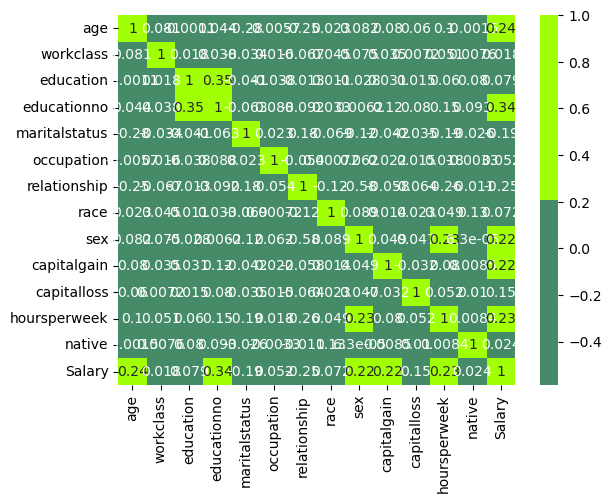

In [42]:
color=['#458B68','#A1FF06']
pal=sns.color_palette(color)
sns.heatmap(salary_train.corr(),cmap=pal,annot=True)

In [43]:
salary_train[salary_train.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
326,33,2,9,13,2,3,0,4,1,0,0,40,37,1
364,27,2,9,13,4,2,1,4,1,0,0,50,37,0
518,24,2,11,9,4,5,4,2,0,0,0,40,37,0
525,24,2,11,9,4,2,3,4,1,0,0,40,37,0
619,33,2,9,13,2,3,0,4,1,0,0,40,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30110,47,2,11,9,2,2,0,4,1,0,0,40,37,0
30118,20,2,11,9,4,6,3,4,1,0,0,40,37,0
30132,22,2,15,10,4,0,3,4,1,0,0,40,37,0
30157,40,2,11,9,2,6,0,4,1,0,0,40,37,1


In [44]:
salary_train.drop_duplicates(inplace=True)
salary_train.reset_index(drop=True,inplace=True)

In [45]:
salary_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174,0,40,37,0
1,50,4,9,13,2,3,0,4,1,0,0,13,37,0
2,38,2,11,9,0,5,1,4,1,0,0,40,37,0
3,53,2,1,7,2,5,0,2,1,0,0,40,37,0
4,28,2,9,13,2,9,5,2,0,0,0,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,53,2,12,14,2,3,0,4,1,0,0,40,37,1
26899,22,2,15,10,4,10,1,4,1,0,0,40,37,0
26900,27,2,7,12,2,12,5,4,0,0,0,38,37,0
26901,58,2,11,9,6,0,4,4,0,0,0,40,37,0


In [46]:
salary_train.shape

(26903, 14)

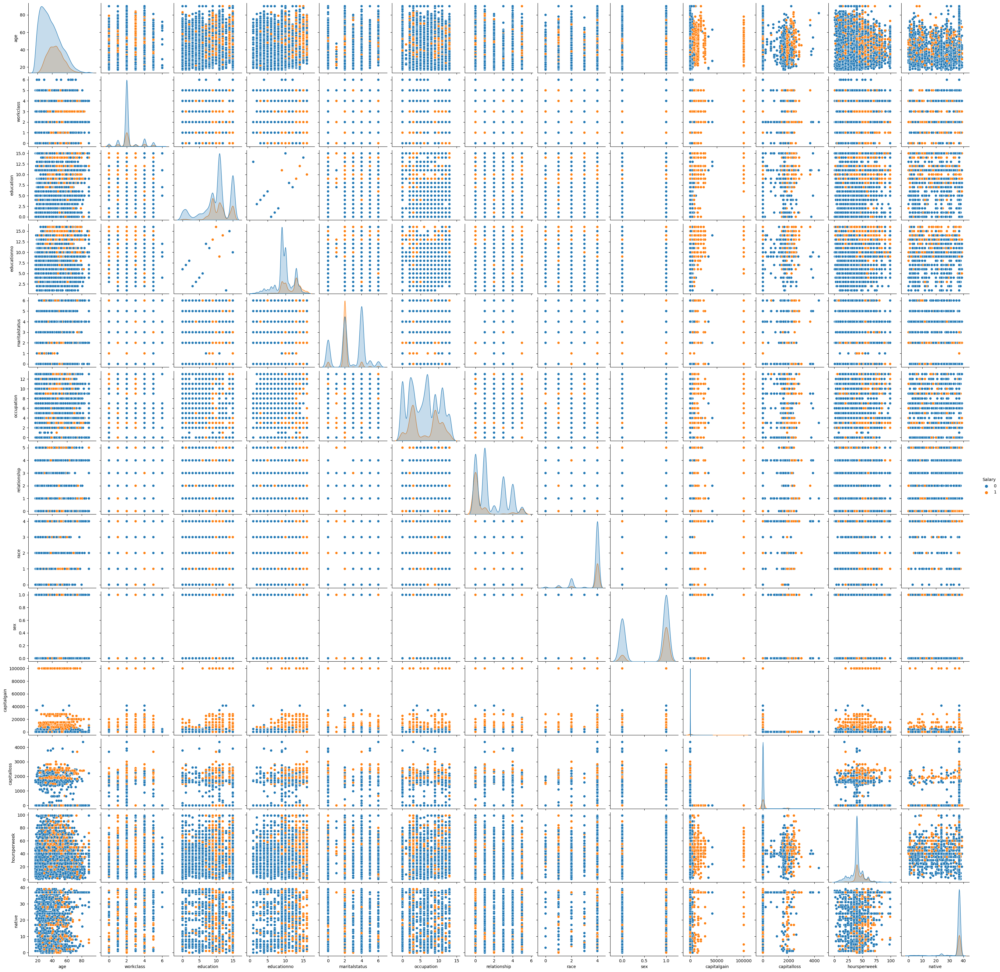

In [24]:
sns.pairplot(data=salary_train,hue='Salary')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'age'),
  Text(1, 0, 'workclass'),
  Text(2, 0, 'education'),
  Text(3, 0, 'educationno'),
  Text(4, 0, 'maritalstatus'),
  Text(5, 0, 'occupation'),
  Text(6, 0, 'relationship'),
  Text(7, 0, 'race'),
  Text(8, 0, 'sex'),
  Text(9, 0, 'capitalgain'),
  Text(10, 0, 'capitalloss'),
  Text(11, 0, 'hoursperweek'),
  Text(12, 0, 'native'),
  Text(13, 0, 'Salary')])

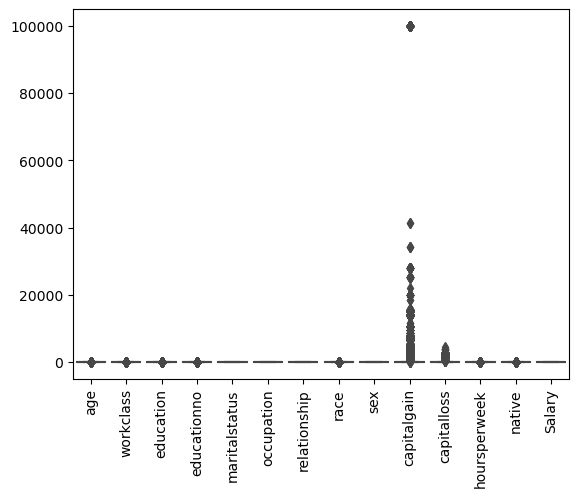

In [47]:
sns.boxplot(data=salary_train)
plt.xticks(rotation=90)

# scale the data

In [19]:
from sklearn.preprocessing import StandardScaler

In [20]:
sd_scaler=StandardScaler()

In [29]:
salary_train['capitalgain']=sd_scaler.fit_transform(salary_train['capitalgain'].values.reshape(-1,1))
salary_train['capitalloss']=sd_scaler.fit_transform(salary_train['capitalloss'].values.reshape(-1,1))


In [30]:
salary_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,0.122810,-0.23133,40,37,0
1,50,4,9,13,2,3,0,4,1,-0.155722,-0.23133,13,37,0
2,38,2,11,9,0,5,1,4,1,-0.155722,-0.23133,40,37,0
3,53,2,1,7,2,5,0,2,1,-0.155722,-0.23133,40,37,0
4,28,2,9,13,2,9,5,2,0,-0.155722,-0.23133,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,53,2,12,14,2,3,0,4,1,-0.155722,-0.23133,40,37,1
26899,22,2,15,10,4,10,1,4,1,-0.155722,-0.23133,40,37,0
26900,27,2,7,12,2,12,5,4,0,-0.155722,-0.23133,38,37,0
26901,58,2,11,9,6,0,4,4,0,-0.155722,-0.23133,40,37,0


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'age'),
  Text(1, 0, 'workclass'),
  Text(2, 0, 'education'),
  Text(3, 0, 'educationno'),
  Text(4, 0, 'maritalstatus'),
  Text(5, 0, 'occupation'),
  Text(6, 0, 'relationship'),
  Text(7, 0, 'race'),
  Text(8, 0, 'sex'),
  Text(9, 0, 'capitalgain'),
  Text(10, 0, 'capitalloss'),
  Text(11, 0, 'hoursperweek'),
  Text(12, 0, 'native'),
  Text(13, 0, 'Salary')])

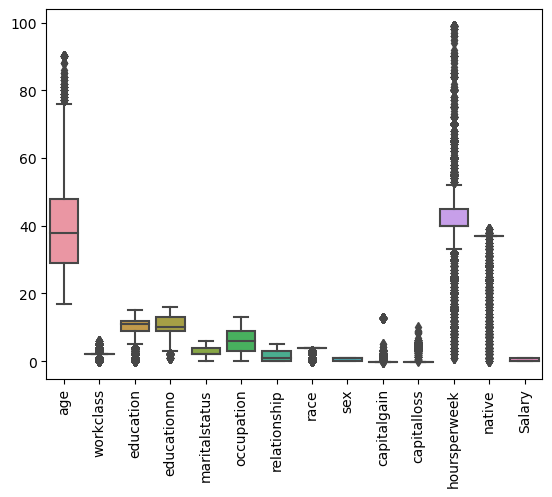

In [31]:
sns.boxplot(data=salary_train)
plt.xticks(rotation=90)

In [5]:
salary_test=pd.read_csv('SalaryData_Test(1).csv')
salary_test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0,0,40,United-States,<=50K
15056,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
15057,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
15058,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


In [6]:
from sklearn.preprocessing import LabelEncoder

In [7]:
label=LabelEncoder()

In [8]:
salary_test['workclass']=label.fit_transform(salary_test['workclass'])
salary_test['education']=label.fit_transform(salary_test['education'])
salary_test['maritalstatus']=label.fit_transform(salary_test['maritalstatus'])
salary_test['occupation']=label.fit_transform(salary_test['occupation'])
salary_test['relationship']=label.fit_transform(salary_test['relationship'])
salary_test['race']=label.fit_transform(salary_test['race'])
salary_test['sex']=label.fit_transform(salary_test['sex'])
salary_test['native']=label.fit_transform(salary_test['native'])
salary_test['Salary']=label.fit_transform(salary_test['Salary'])



In [9]:
salary_test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,0
1,38,2,11,9,2,4,0,4,1,0,0,50,37,0
2,28,1,7,12,2,10,0,4,1,0,0,40,37,1
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,1
4,34,2,0,6,4,7,1,4,1,0,0,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,2,9,13,4,9,3,4,1,0,0,40,37,0
15056,39,2,9,13,0,9,1,4,0,0,0,36,37,0
15057,38,2,9,13,2,9,0,4,1,0,0,50,37,0
15058,44,2,9,13,0,0,3,1,1,5455,0,40,37,0


In [10]:
salary_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15060 entries, 0 to 15059
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   age            15060 non-null  int64
 1   workclass      15060 non-null  int32
 2   education      15060 non-null  int32
 3   educationno    15060 non-null  int64
 4   maritalstatus  15060 non-null  int32
 5   occupation     15060 non-null  int32
 6   relationship   15060 non-null  int32
 7   race           15060 non-null  int32
 8   sex            15060 non-null  int32
 9   capitalgain    15060 non-null  int64
 10  capitalloss    15060 non-null  int64
 11  hoursperweek   15060 non-null  int64
 12  native         15060 non-null  int32
 13  Salary         15060 non-null  int32
dtypes: int32(9), int64(5)
memory usage: 1.1 MB


In [11]:
salary_test.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

<Axes: >

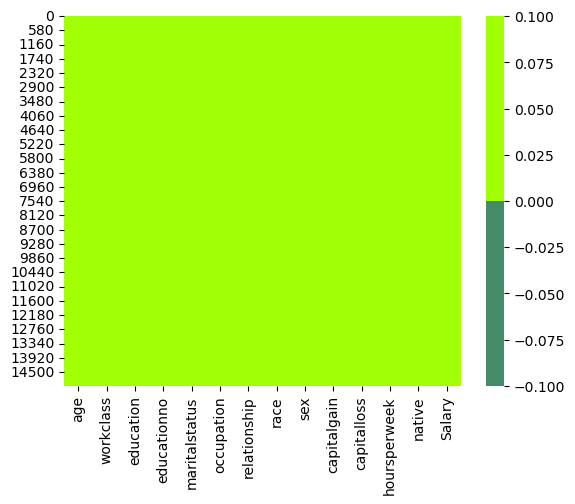

In [12]:
color=['#458B68','#A1FF06']
pal=sns.color_palette(color)
sns.heatmap(salary_test.isnull(),cmap=pal)

In [40]:
salary_test.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.096037,-0.007948,0.026123,-0.262577,-0.002214,-0.249701,0.024485,0.082265,0.078760,0.057745,0.102758,-0.005683,0.227469
workclass,0.096037,1.000000,0.018005,0.046623,-0.031329,0.021271,-0.060235,0.059749,0.059161,0.032980,0.010242,0.052614,-0.003635,0.011008
education,-0.007948,0.018005,1.000000,0.351486,-0.043117,-0.023999,-0.014227,0.012133,-0.026978,0.028626,0.020568,0.062892,0.077065,0.085554
educationno,0.026123,0.046623,0.351486,1.000000,-0.068079,0.093643,-0.081413,0.029355,-0.002052,0.131750,0.085817,0.133691,0.097188,0.327813
maritalstatus,-0.262577,-0.031329,-0.043117,-0.068079,1.000000,0.003854,0.185495,-0.073718,-0.120374,-0.042405,-0.034073,-0.171665,-0.016532,-0.191058
occupation,-0.002214,0.021271,-0.023999,0.093643,0.003854,1.000000,-0.047381,-0.001561,0.045244,0.014165,0.016580,0.011755,-0.001311,0.046218
relationship,-0.249701,-0.060235,-0.014227,-0.081413,0.185495,-0.047381,1.000000,-0.121481,-0.579212,-0.054040,-0.048091,-0.261905,0.000500,-0.258335
race,0.024485,0.059749,0.012133,0.029355,-0.073718,-0.001561,-0.121481,1.000000,0.088450,0.013539,0.015799,0.037125,0.125514,0.069227
sex,0.082265,0.059161,-0.026978,-0.002052,-0.120374,0.045244,-0.579212,0.088450,1.000000,0.044843,0.045360,0.231744,-0.014178,0.213863
capitalgain,0.078760,0.032980,0.028626,0.131750,-0.042405,0.014165,-0.054040,0.013539,0.044843,1.000000,-0.031876,0.090501,0.005923,0.220882


<Axes: >

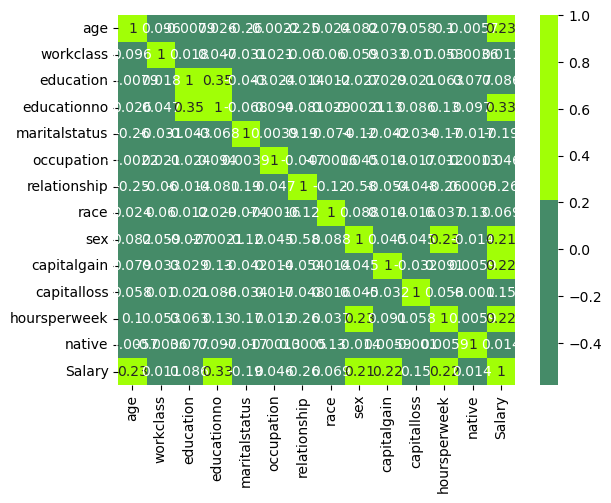

In [13]:
color=['#458B68','#A1FF06']
pal=sns.color_palette(color)
sns.heatmap(salary_test.corr(),cmap=pal,annot=True)

In [14]:
salary_test[salary_test.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
551,59,2,11,9,0,7,1,4,0,0,0,40,37,0
601,32,2,11,9,2,11,0,4,1,0,0,40,37,0
681,40,2,11,9,2,2,0,4,1,0,0,40,37,0
799,24,2,9,13,4,9,1,4,1,0,0,35,37,0
1044,44,2,14,15,2,9,0,4,1,99999,0,60,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15043,51,2,11,9,2,2,0,4,1,0,0,40,37,0
15044,22,2,15,10,4,2,3,4,1,0,0,40,37,0
15049,32,2,11,9,2,5,0,4,1,0,0,40,37,0
15052,31,2,11,9,2,2,0,4,1,0,0,40,37,0


In [15]:
salary_test.drop_duplicates(inplace=True)
salary_test.reset_index(drop=True,inplace=True)

In [16]:
salary_test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,0
1,38,2,11,9,2,4,0,4,1,0,0,50,37,0
2,28,1,7,12,2,10,0,4,1,0,0,40,37,1
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,1
4,34,2,0,6,4,7,1,4,1,0,0,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,33,2,9,13,4,9,3,4,1,0,0,40,37,0
14126,39,2,9,13,0,9,1,4,0,0,0,36,37,0
14127,38,2,9,13,2,9,0,4,1,0,0,50,37,0
14128,44,2,9,13,0,0,3,1,1,5455,0,40,37,0


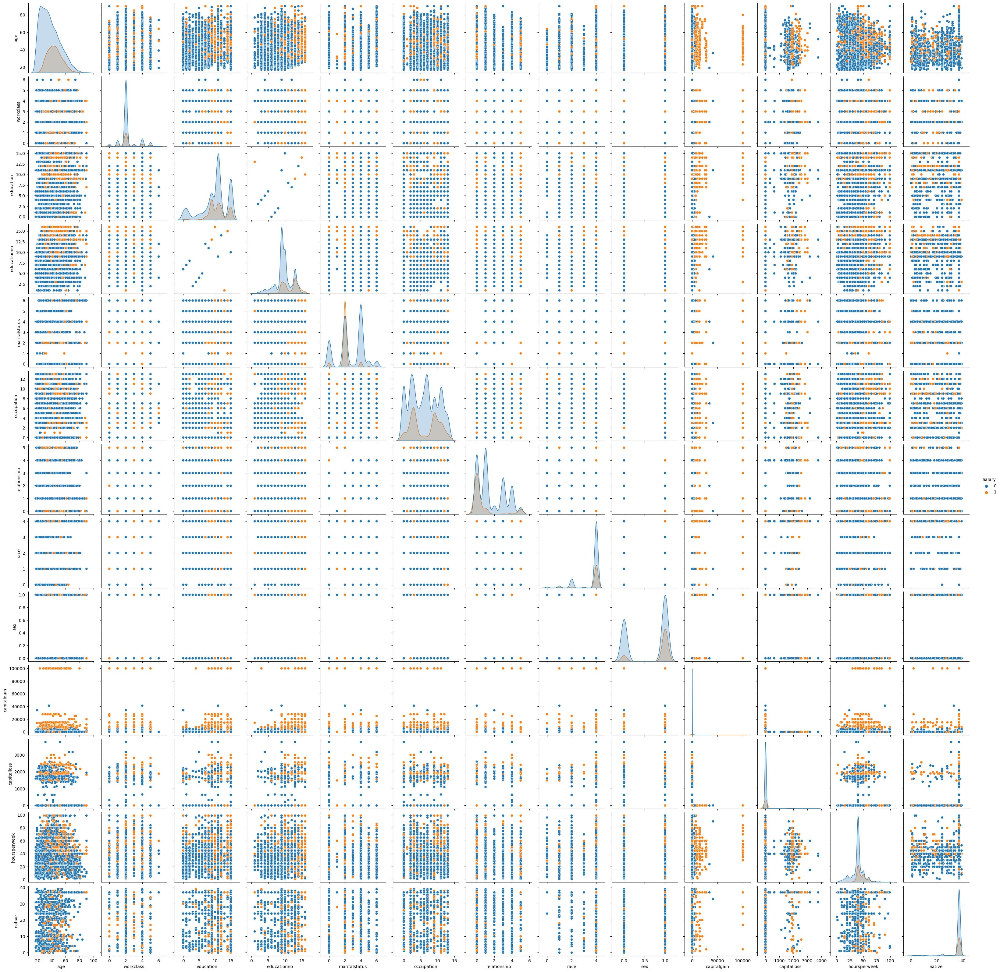

In [45]:
sns.pairplot(data=salary_test,hue='Salary')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'age'),
  Text(1, 0, 'workclass'),
  Text(2, 0, 'education'),
  Text(3, 0, 'educationno'),
  Text(4, 0, 'maritalstatus'),
  Text(5, 0, 'occupation'),
  Text(6, 0, 'relationship'),
  Text(7, 0, 'race'),
  Text(8, 0, 'sex'),
  Text(9, 0, 'capitalgain'),
  Text(10, 0, 'capitalloss'),
  Text(11, 0, 'hoursperweek'),
  Text(12, 0, 'native'),
  Text(13, 0, 'Salary')])

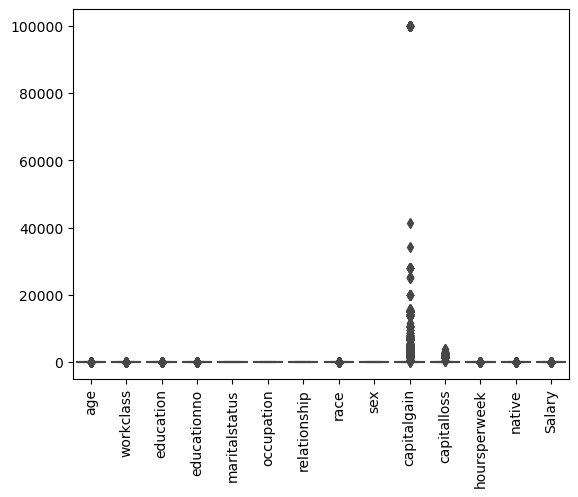

In [17]:
sns.boxplot(data=salary_test)
plt.xticks(rotation=90)

In [21]:
salary_test['capitalgain']=sd_scaler.fit_transform(salary_test['capitalgain'].values.reshape(-1,1))

In [22]:
salary_test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,-0.150059,0,40,37,0
1,38,2,11,9,2,4,0,4,1,-0.150059,0,50,37,0
2,28,1,7,12,2,10,0,4,1,-0.150059,0,40,37,1
3,44,2,15,10,2,6,0,2,1,0.822747,0,40,37,1
4,34,2,0,6,4,7,1,4,1,-0.150059,0,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,33,2,9,13,4,9,3,4,1,-0.150059,0,40,37,0
14126,39,2,9,13,0,9,1,4,0,-0.150059,0,36,37,0
14127,38,2,9,13,2,9,0,4,1,-0.150059,0,50,37,0
14128,44,2,9,13,0,0,3,1,1,0.540193,0,40,37,0


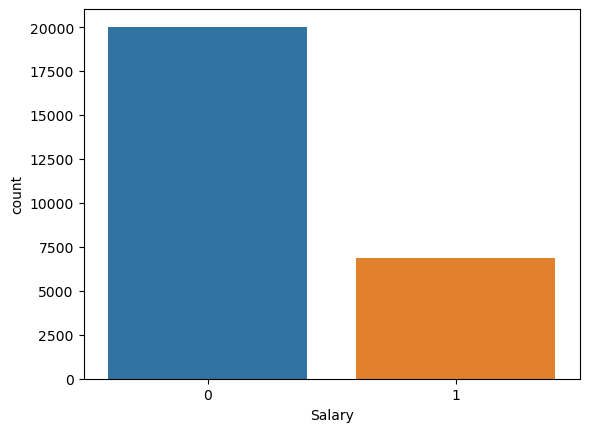

0    20023
1     6880
Name: Salary, dtype: int64

In [49]:
sns.countplot(x='Salary',data=salary_train)
plt.xlabel('Salary')
plt.ylabel('count')
plt.show()
salary_train['Salary'].value_counts()

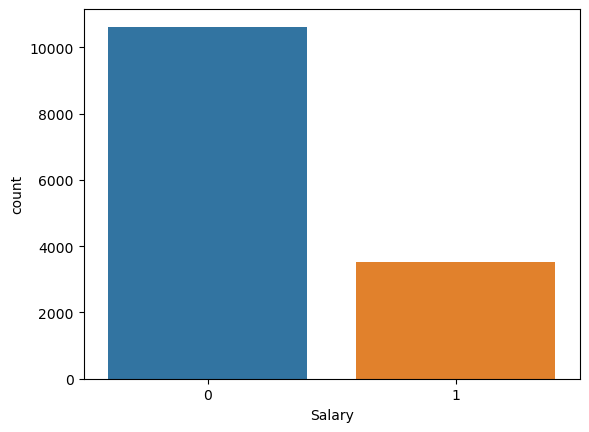

0    10620
1     3510
Name: Salary, dtype: int64

In [50]:
sns.countplot(x='Salary',data=salary_test)
plt.xlabel('Salary')
plt.ylabel('count')
plt.show()
salary_test['Salary'].value_counts()

<Axes: ylabel='education'>

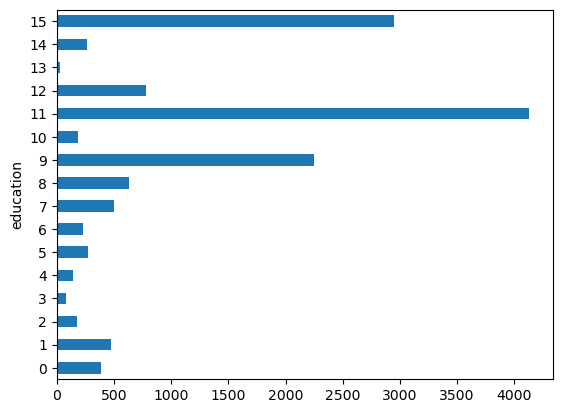

In [51]:
pd.crosstab(salary_train['Salary'],salary_train['education']).mean().plot(kind='barh')

<Axes: ylabel='educationno'>

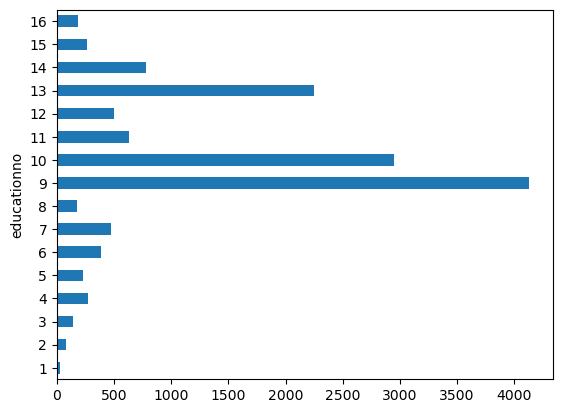

In [52]:
pd.crosstab(salary_train['Salary'],salary_train['educationno']).mean().plot(kind='barh')

<Axes: ylabel='maritalstatus'>

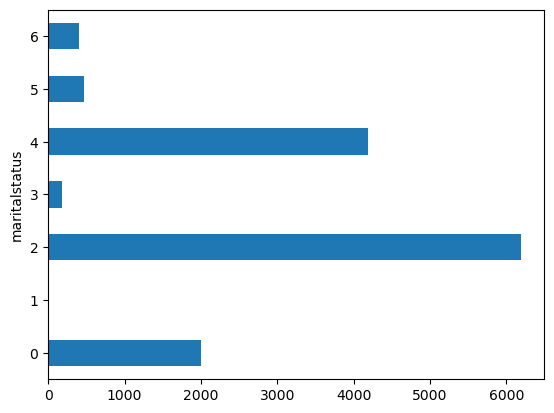

In [53]:
pd.crosstab(salary_train['Salary'],salary_train['maritalstatus']).mean().plot(kind='barh')

<Axes: ylabel='occupation'>

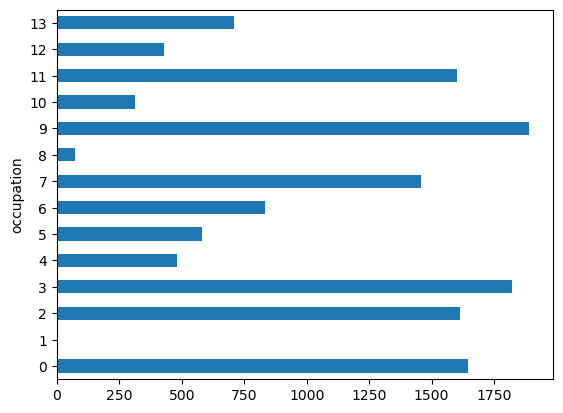

In [54]:
pd.crosstab(salary_train['Salary'],salary_train['occupation']).mean().plot(kind='barh')

<Axes: ylabel='sex'>

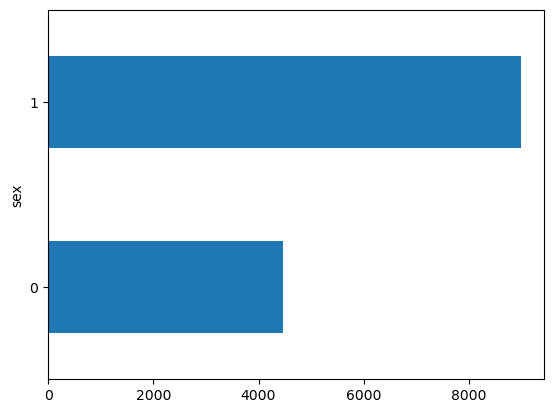

In [55]:
pd.crosstab(salary_train['Salary'],salary_train['sex']).mean().plot(kind='barh')

<Axes: ylabel='native'>

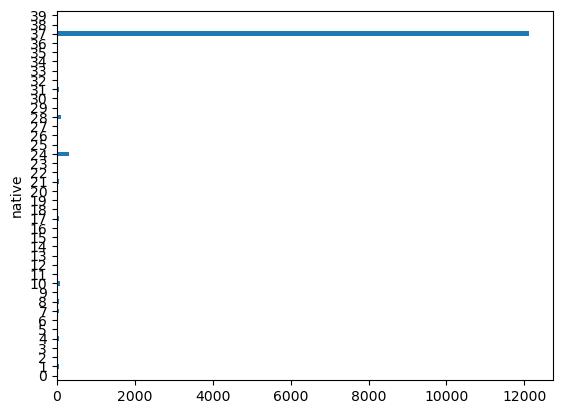

In [56]:
pd.crosstab(salary_train['Salary'],salary_train['native']).mean().plot(kind='barh')

<Axes: ylabel='education'>

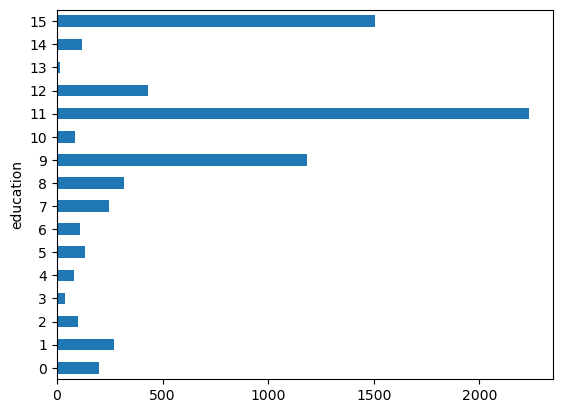

In [57]:
pd.crosstab(salary_test['Salary'],salary_test['education']).mean().plot(kind='barh')

<Axes: ylabel='educationno'>

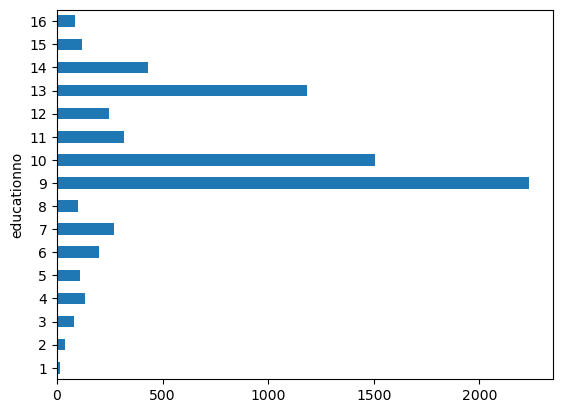

In [58]:
pd.crosstab(salary_test['Salary'],salary_test['educationno']).mean().plot(kind='barh')

<Axes: ylabel='maritalstatus'>

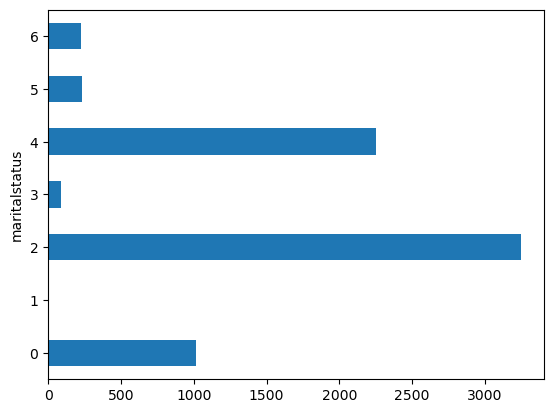

In [59]:
pd.crosstab(salary_test['Salary'],salary_test['maritalstatus']).mean().plot(kind='barh')

<Axes: ylabel='occupation'>

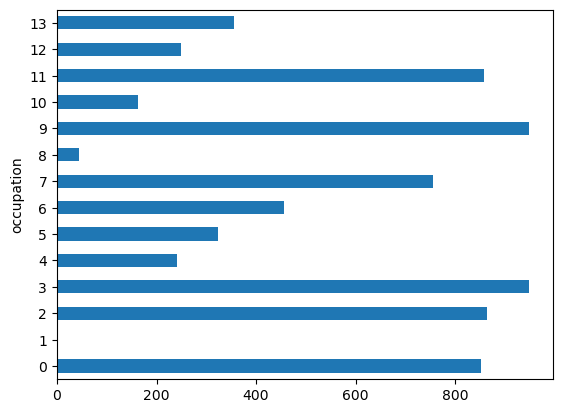

In [60]:
pd.crosstab(salary_test['Salary'],salary_test['occupation']).mean().plot(kind='barh')

<Axes: ylabel='sex'>

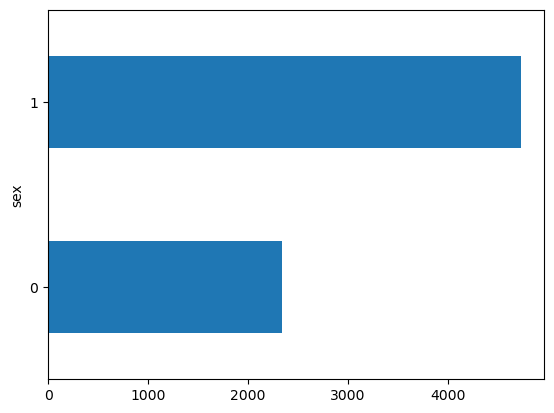

In [61]:
pd.crosstab(salary_test['Salary'],salary_test['sex']).mean().plot(kind='barh')

<Axes: ylabel='native'>

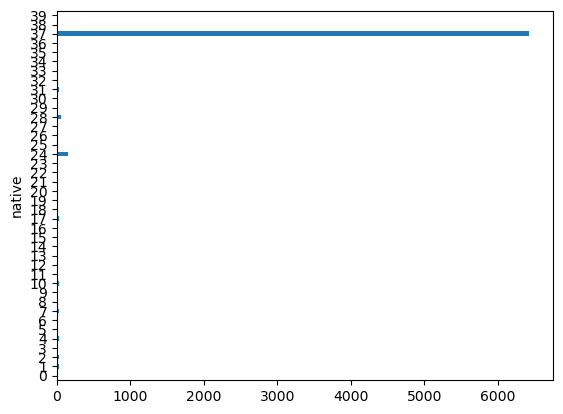

In [62]:
pd.crosstab(salary_test['Salary'],salary_test['native']).mean().plot(kind='barh')

In [48]:
train_X=salary_train.iloc[:,:13]
train_y=salary_train.iloc[:,13]
test_X=salary_test.iloc[:,:13]
test_y=salary_test.iloc[:,13]
                          

In [49]:
from imblearn.over_sampling import SMOTE

In [50]:
smote=SMOTE(sampling_strategy='auto')

In [51]:
train_X,train_y=smote.fit_resample(train_X,train_y)

In [52]:
test_X,test_y=smote.fit_resample(test_X,test_y)

# build the model

In [54]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,classification_report,roc_curve,roc_auc_score


In [55]:
model=SVC(C=0.55,gamma=0.001,kernel='rbf')

In [56]:
model.fit(train_X,train_y)

SVC(C=0.55, gamma=0.001)

In [57]:
train_pred=model.predict(train_X)
train_pred

array([0, 0, 0, ..., 1, 1, 1], dtype=int8)

In [58]:
cm=confusion_matrix(train_y,train_pred)
cm

array([[15937,  4086],
       [ 3565, 16458]], dtype=int64)

<Axes: >

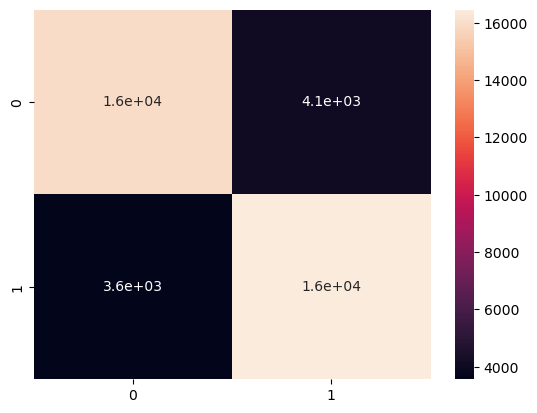

In [59]:
sns.heatmap(cm,annot=True)

In [60]:
print(classification_report(train_y,train_pred))

              precision    recall  f1-score   support

           0       0.82      0.80      0.81     20023
           1       0.80      0.82      0.81     20023

    accuracy                           0.81     40046
   macro avg       0.81      0.81      0.81     40046
weighted avg       0.81      0.81      0.81     40046



# testing data

In [62]:
test_pred=model.predict(test_X)
test_pred

array([0, 1, 0, ..., 1, 1, 1], dtype=int8)

In [63]:
cm=confusion_matrix(test_y,test_pred)
cm

array([[8253, 2367],
       [2430, 8190]], dtype=int64)

<Axes: >

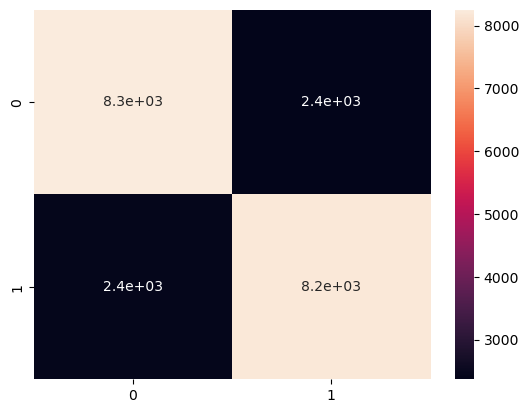

In [64]:
sns.heatmap(cm,annot=True)

In [65]:
print(classification_report(test_y,test_pred))

              precision    recall  f1-score   support

           0       0.77      0.78      0.77     10620
           1       0.78      0.77      0.77     10620

    accuracy                           0.77     21240
   macro avg       0.77      0.77      0.77     21240
weighted avg       0.77      0.77      0.77     21240



# visualize the salary  training data

In [67]:
from sklearn.manifold import TSNE

In [68]:
tsne = TSNE(n_components=2)

In [109]:
tsne_comps = tsne.fit_transform(train_X)
tsne_comps

array([[ -31.585188 ,   -1.0031569],
       [ -26.061068 , -108.476746 ],
       [  -9.546618 ,  -44.027054 ],
       ...,
       [ -38.493847 ,   22.628029 ],
       [   1.1901166,  -26.253817 ],
       [  64.218796 ,  -18.193499 ]], dtype=float32)

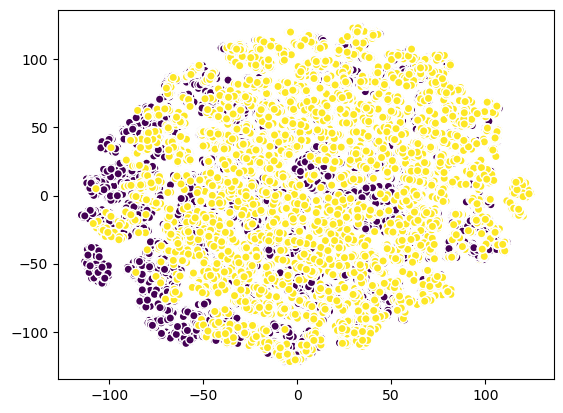

In [110]:
plt.scatter(tsne_comps[:,0],tsne_comps[:,1] ,c=train_y,cmap='viridis',edgecolors='white')
plt.show()

# visualize the salary  testing data

In [111]:
tsne_comps = tsne.fit_transform(test_X)
tsne_comps

array([[ 66.86026  , -39.14135  ],
       [-43.968452 ,  19.245451 ],
       [ 51.855385 , -53.33547  ],
       ...,
       [ -2.0978281,  94.1042   ],
       [ -7.87616  ,  37.783543 ],
       [-47.773666 ,  12.331212 ]], dtype=float32)

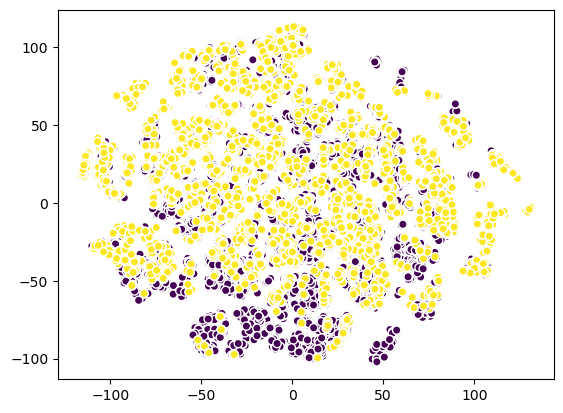

In [112]:
plt.scatter(tsne_comps[:,0],tsne_comps[:,1] ,c=test_y,cmap='viridis',edgecolors='white')
plt.show()